In [ ]:
!pip install -q rembg
!apt-get install libgl1 -y  # necesario para OpenCV en Colab
!pip install onnxruntime
!pip install timm
!pip install torch torchvision

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libgl1 is already the newest version (1.4.0-1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 92.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 7.8 MB/s eta 0:00:00


# Preprocesamiento de las imagenes

## Eliminacion del Fondo de las imagenes

In [ ]:
import os
from PIL import Image
from rembg import remove
import numpy as np
from tifffile import imread, imwrite
from tqdm import tqdm

# Definir rutas
input_dir = "/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/feathers/uvb_feathers"
output_dir = "/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/feathers/processed_feathers_uvb"

os.makedirs(output_dir, exist_ok=True)

# Función para encontrar imágenes TIFF
def find_tiff_images(folder):
    paths = []
    for root, _, files in os.walk(folder):
        for f in files:
            if f.lower().endswith(('.tif', '.tiff')):
                paths.append(os.path.join(root, f))
    return paths

# Procesamiento individual de imagen
def apply_mask_and_save(image_path, output_base):
    try:
        img = imread(image_path)

        # Validación: imagen debe tener 4 canales
        if img.ndim != 3 or img.shape[2] != 4:
            print(f"Saltando: {image_path} (esperado 4 canales)")
            return

        # Convertir canales RGB a imagen PIL
        rgb = img[:, :, :3].astype(np.uint8)
        rgb_pil = Image.fromarray(rgb)

        # Aplicar rembg
        no_bg = remove(rgb_pil)
        no_bg_arr = np.array(no_bg)

        # Validar que rembg devuelve canal alfa
        if no_bg_arr.ndim != 3 or no_bg_arr.shape[2] != 4:
            print(f"Saltando: {image_path} (rembg sin canal alfa)")
            return

        # Crear máscara binaria desde canal alfa
        mask = (no_bg_arr[:, :, 3] > 0).astype(np.uint8)

        # Aplicar máscara a los 4 canales
        masked = np.zeros_like(img)
        for c in range(4):
            masked[:, :, c] = img[:, :, c] * mask

        # Guardar imagen TIFF respetando estructura de carpetas
        rel_path = os.path.relpath(image_path, input_dir)
        out_path = os.path.join(output_base, rel_path)
        os.makedirs(os.path.dirname(out_path), exist_ok=True)

        imwrite(out_path, masked)
    except Exception as e:
        print(f"Error con {image_path}: {e}")

# Ejecutar el procesamiento
if __name__ == "__main__":
    image_paths = find_tiff_images(input_dir)
    print(f"Se encontraron {len(image_paths)} imágenes en {input_dir}")

    for img_path in tqdm(image_paths, desc="Procesando imágenes TIFF"):
        apply_mask_and_save(img_path, output_dir)


Se encontraron 1413 imágenes en /content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/feathers/uvb_feathers


Procesando imágenes TIFF:   0%|          | 0/1413 [00:00<?, ?it/s]Downloading data from 'https://github.com/danielgatis/rembg/releases/download/v0.0.0/u2net.onnx' to file '/root/.u2net/u2net.onnx'.

  0%|                                               | 0.00/176M [00:00<?, ?B/s]
  2%|▊                                     | 3.77M/176M [00:00<00:04, 37.7MB/s]
  6%|██▎                                   | 10.6M/176M [00:00<00:02, 56.0MB/s]
 10%|███▊                                  | 17.8M/176M [00:00<00:02, 62.9MB/s]
 14%|█████▍                                | 25.3M/176M [00:00<00:02, 67.7MB/s]
 18%|██████▉                               | 32.0M/176M [00:00<00:02, 66.5MB/s]
 22%|████████▎                             | 38.7M/176M [00:00<00:02, 65.3MB/s]
 26%|█████████▊                            | 45.2M/176M [00:00<00:02, 64.9MB/s]
 29%|███████████▏                          | 51.7M/176M [00:00<00:01, 64.9MB/s]
 33%|████████████▌                         | 58.2M/176M [00:00<00:01, 63.2MB/s]
 

## Normalizacion de la imagenes sin fondo a un tamaño 224 x 224

In [ ]:
import os
import numpy as np
from tifffile import imread, imwrite
from tqdm import tqdm
import cv2

input_dir = "/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/feathers/processed_feathers_uvb"
resized_dir = "/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/feathers/resized_feathers_uvb"
target_size = (224, 224)

os.makedirs(resized_dir, exist_ok=True)

def resize_tiff_image(img, size=(224, 224), interpolation=cv2.INTER_LANCZOS4):
    height, width = size
    channels = img.shape[2]
    dtype = img.dtype  # Mantener el tipo original: uint8, uint16, float32...
    resized = np.zeros((height, width, channels), dtype=dtype)

    for c in range(channels):
        resized[:, :, c] = cv2.resize(img[:, :, c], size, interpolation=interpolation)

    return resized

def preprocess_images(input_dir, output_dir):
    for root, _, files in os.walk(input_dir):
        for file in files:
            if file.lower().endswith(('.tiff', '.tif')):
                input_path = os.path.join(root, file)
                rel_path = os.path.relpath(input_path, input_dir)
                output_path = os.path.join(output_dir, rel_path)
                os.makedirs(os.path.dirname(output_path), exist_ok=True)

                try:
                    img = imread(input_path)
                    if img.ndim == 3 and img.shape[2] == 4:
                        resized_img = resize_tiff_image(img, target_size)
                        imwrite(output_path, resized_img)
                except Exception as e:
                    print(f"Error procesando {input_path}: {e}")

# Ejecutar preprocesamiento
preprocess_images(input_dir, resized_dir)


# Entrenamiento Autosupervisado

## Aplicación de BEiT preentrenado (usando solo RGB)

In [ ]:
import timm
import torch
from torchvision import transforms
from PIL import Image
from tifffile import imread
import os
import numpy as np
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Directorio de imágenes ya resizeadas (224x224, fondo eliminado)
image_dir = "/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/feathers/resized_feathers_uvb"
embedding_dir = "/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/embeddings_feathers_beit_rgb"
os.makedirs(embedding_dir, exist_ok=True)

# BEiT preentrenado
model = timm.create_model('beit_base_patch16_224', pretrained=True)
model.head = torch.nn.Identity()  # Removemos la capa de clasificación
model.to(device)
model.eval()

# Transformación para BEiT (sin normalización ImageNet porque son datos específicos)
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224, 224))
])

# Función para recorrer carpetas TIFF y extraer embeddings con solo RGB
def extract_embeddings_rgb(image_dir, output_dir):
    embeddings = []
    image_names = []

    for root, _, files in os.walk(image_dir):
        for file in files:
            if file.lower().endswith(('.tiff', '.tif')):
                path = os.path.join(root, file)
                try:
                    img_arr = imread(path)
                    if img_arr.ndim == 3 and img_arr.shape[2] >= 3:
                        rgb = img_arr[:, :, :3]
                        rgb = Image.fromarray(rgb.astype(np.uint8))
                        tensor = transform(rgb).unsqueeze(0).to(device)
                        with torch.no_grad():
                            embedding = model(tensor)
                            embeddings.append(embedding.cpu().numpy().flatten())
                            image_names.append(os.path.relpath(path, image_dir))
                except Exception as e:
                    print(f"Error con {file}: {e}")

    return image_names, np.array(embeddings)

# Ejecutar extracción
image_names, embeddings = extract_embeddings_rgb(image_dir, embedding_dir)

# Guardar resultados para análisis posterior
import pandas as pd
df_embeddings = pd.DataFrame(embeddings)
df_embeddings["image"] = image_names
df_embeddings.to_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_rgb_embeddings.csv", index=False)

print(f"✅ Embeddings extraídos: {df_embeddings.shape}")


✅ Embeddings extraídos: (1413, 769)


## Código inicial para adaptar BEiT a imágenes RGBA (4 canales)

In [ ]:
import torch
import torch.nn as nn
import timm
import copy

# Cargar BEiT original
beit_model = timm.create_model('beit_base_patch16_224', pretrained=True)
beit_model.head = nn.Identity()

# Clonar el modelo
beit_4ch = copy.deepcopy(beit_model)

# Modificar la capa de entrada
old_proj = beit_4ch.patch_embed.proj  # Conv2d(3, embed_dim, kernel_size=16, stride=16)
new_proj = nn.Conv2d(4, old_proj.out_channels, kernel_size=old_proj.kernel_size,
                     stride=old_proj.stride, padding=old_proj.padding, bias=old_proj.bias is not None)

# Copiar pesos preentrenados
with torch.no_grad():
    new_proj.weight[:, :3] = old_proj.weight  # RGB
    new_proj.weight[:, 3:] = old_proj.weight[:, :1] * 0  # UVB inicializado en 0
    if old_proj.bias is not None:
        new_proj.bias[:] = old_proj.bias

# Reemplazar en el modelo
beit_4ch.patch_embed.proj = new_proj
beit_4ch.to(device)
beit_4ch.eval()


Beit(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(4, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (blocks): ModuleList(
    (0-11): 12 x Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=False)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity()
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop2): Dropout(p=0.0, inplace=False)
      )
      (drop_

## Extraer embeddings con BEiT adaptado (4 canales)

In [ ]:
# Transformación sin eliminar UVB
def preprocess_4ch(img_arr):
    if img_arr.shape[2] != 4:
        raise ValueError("Imagen sin 4 canales")
    img_resized = np.zeros((224, 224, 4), dtype=np.uint8)
    for c in range(4):
        img_resized[:, :, c] = cv2.resize(img_arr[:, :, c], (224, 224))
    return torch.tensor(img_resized).permute(2, 0, 1).float() / 255.0  # [C, H, W]

# Ruta de imágenes ya segmentadas y resizeadas
image_dir_4ch = "/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/feathers/resized_feathers_uvb"


# Extraer embeddings con canal UVB incluido
embeddings_4ch = []
image_names_4ch = []

for root, _, files in os.walk(image_dir_4ch):
    for file in files:
        if file.lower().endswith(('.tiff', '.tif')):
            path = os.path.join(root, file)
            try:
                img_arr = imread(path)
                if img_arr.ndim == 3 and img_arr.shape[2] == 4:
                    tensor = preprocess_4ch(img_arr).unsqueeze(0).to(device)
                    with torch.no_grad():
                        embedding = beit_4ch(tensor)
                        embeddings_4ch.append(embedding.cpu().numpy().flatten())
                        image_names_4ch.append(os.path.relpath(path, image_dir_4ch))
            except Exception as e:
                print(f"Error con {file}: {e}")

# Guardar resultados
df_embed_4ch = pd.DataFrame(embeddings_4ch)
df_embed_4ch["image"] = image_names_4ch
df_embed_4ch.to_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_4ch_embeddings.csv", index=False)

print(f"✅ Embeddings 4 canales extraídos: {df_embed_4ch.shape}")


✅ Embeddings 4 canales extraídos: (1413, 769)


## Comparación de Embeddings (RGB vs. RGB+UVB)

In [ ]:
!pip install umap-learn scikit-learn matplotlib seaborn


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


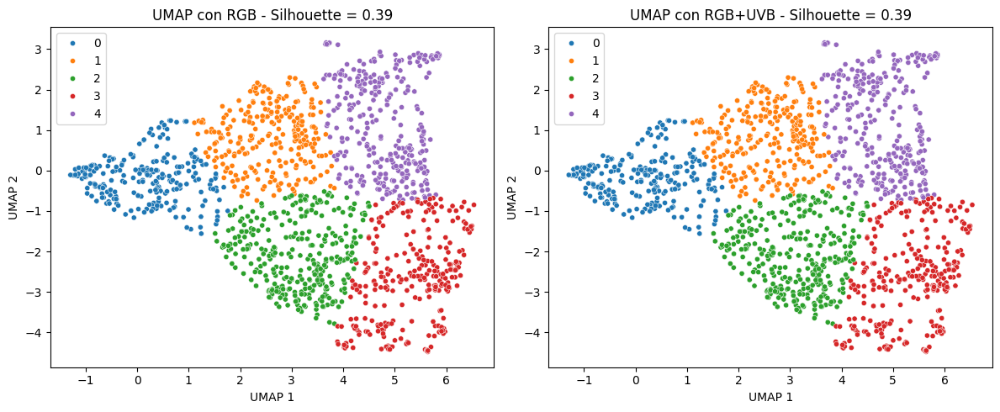

In [ ]:
import pandas as pd
import umap
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar embeddings
df_rgb = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_rgb_embeddings.csv")
df_4ch = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_4ch_embeddings.csv")

X_rgb = df_rgb.drop(columns=["image"]).values
X_4ch = df_4ch.drop(columns=["image"]).values

# UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_rgb_umap = reducer.fit_transform(X_rgb)
X_4ch_umap = reducer.fit_transform(X_4ch)

# Clustering
kmeans_rgb = KMeans(n_clusters=5, random_state=42).fit(X_rgb_umap)
kmeans_4ch = KMeans(n_clusters=5, random_state=42).fit(X_4ch_umap)

labels_rgb = kmeans_rgb.labels_
labels_4ch = kmeans_4ch.labels_

# Evaluación
score_rgb = silhouette_score(X_rgb_umap, labels_rgb)
score_4ch = silhouette_score(X_4ch_umap, labels_4ch)

# Plot RGB
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.scatterplot(x=X_rgb_umap[:, 0], y=X_rgb_umap[:, 1], hue=labels_rgb, palette="tab10", s=20)
plt.title(f"UMAP con RGB - Silhouette = {score_rgb:.2f}")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

# Plot 4 canales
plt.subplot(1, 2, 2)
sns.scatterplot(x=X_4ch_umap[:, 0], y=X_4ch_umap[:, 1], hue=labels_4ch, palette="tab10", s=20)
plt.title(f"UMAP con RGB+UVB - Silhouette = {score_4ch:.2f}")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")
plt.tight_layout()
plt.show()


# Depuracion

In [ ]:
from tifffile import imread

image_dir_4ch = "/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/feathers/resized_feathers_uvb"
for root, _, files in os.walk(image_dir_4ch):
    for file in files:
        if file.lower().endswith(('.tif', '.tiff')):
            path = os.path.join(root, file)
            try:
                img = imread(path)
                print(f"{file} → shape: {img.shape}")
                break  # muestra solo uno
            except Exception as e:
                print(f"Error en {file}: {e}")


passeriformes_malurus_melanocephalus_00007.tif → shape: (224, 224, 4)
passeriformes_telophorus_zeylonus_00022.tif → shape: (224, 224, 4)
passeriformes_sylvia_cantillans_00019.tif → shape: (224, 224, 4)
passeriformes_phylloscopus_collybita_00039.tif → shape: (224, 224, 4)
passeriformes_tchagra_senegalus_00005.tif → shape: (224, 224, 4)
passeriformes_carduelis_carduelis_00005.tif → shape: (224, 224, 4)
passeriformes_emberiza_elegans_00006.tif → shape: (224, 224, 4)
passeriformes_acrocephalus_palustris_00027.tif → shape: (224, 224, 4)
passeriformes_geokichla_sibirica_00006.tif → shape: (224, 224, 4)
passeriformes_cercotrichas_galactotes_00003.tif → shape: (224, 224, 4)
passeriformes_schoeniclus_schoeniclus_00002.tif → shape: (224, 224, 4)
passeriformes_oenanthe_melanoleuca_00008.tif → shape: (224, 224, 4)
passeriformes_ramphocoris_clotbey_00019.tif → shape: (224, 224, 4)
passeriformes_carduelis_cannabina_00297.tif → shape: (224, 224, 4)
passeriformes_cyanocorax_formosus_00001.tif → shape:

# Cladograma inicial

Embeddings RGB con metadatos: (1413, 773)
Embeddings 4CH con metadatos: (1413, 773)


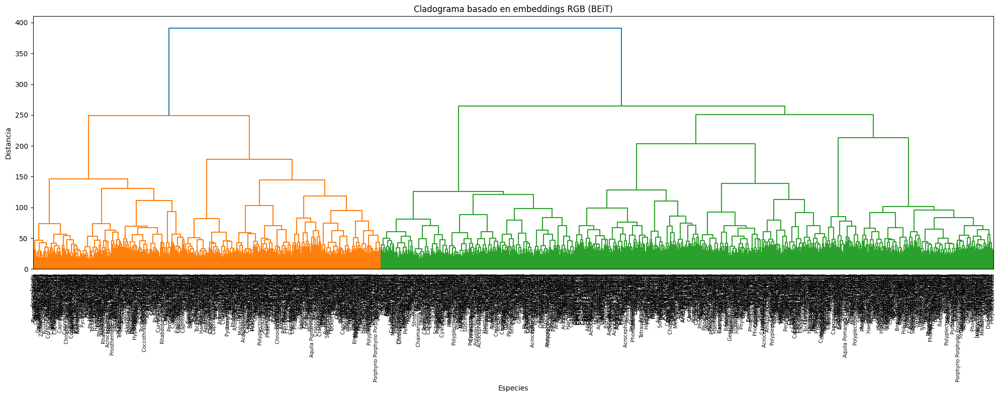

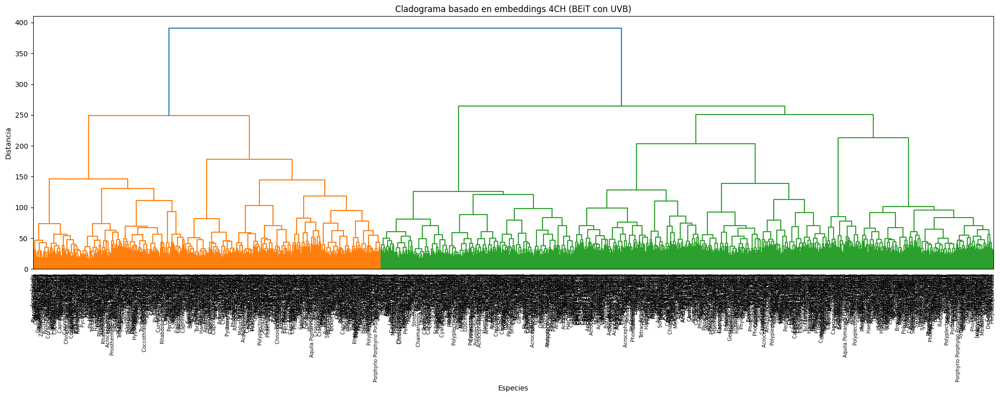

In [1]:
# Paso 1: Importar librerías
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
import os

# Paso 2: Cargar embeddings y metadatos
df_rgb = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_rgb_embeddings.csv")
df_4ch = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_4ch_embeddings.csv")
meta = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/1.Birdcolorbase/feathers_data.csv")

# Paso 3: Extraer el nombre base sin extensión para unificar claves
def remove_extension(filename):
    return os.path.splitext(os.path.basename(filename))[0].lower()

df_rgb['image_id'] = df_rgb['image'].apply(remove_extension)
df_4ch['image_id'] = df_4ch['image'].apply(remove_extension)
meta['image_id'] = meta['filename'].apply(remove_extension)

# Paso 4: Hacer merge con los metadatos
rgb_merged = pd.merge(df_rgb, meta, on='image_id')
ch4_merged = pd.merge(df_4ch, meta, on='image_id')

print(f"Embeddings RGB con metadatos: {rgb_merged.shape}")
print(f"Embeddings 4CH con metadatos: {ch4_merged.shape}")

# Paso 5: Extraer matrices de embeddings y etiquetas
X_rgb = rgb_merged.drop(columns=['image', 'filename', 'order', 'species', 'image_id']).values
X_4ch = ch4_merged.drop(columns=['image', 'filename', 'order', 'species', 'image_id']).values

labels_rgb = rgb_merged['species'].values
labels_4ch = ch4_merged['species'].values

# Paso 6: Clustering jerárquico
Z_rgb = linkage(X_rgb, method='ward')
Z_4ch = linkage(X_4ch, method='ward')

# Paso 7: Visualización del cladograma RGB
plt.figure(figsize=(20, 8))
dendrogram(Z_rgb, labels=labels_rgb, leaf_rotation=90, leaf_font_size=7)
plt.title("Cladograma basado en embeddings RGB (BEiT)")
plt.xlabel("Especies")
plt.ylabel("Distancia")
plt.tight_layout()
plt.show()

# Paso 8: Visualización del cladograma 4 canales (RGB + UVB)
plt.figure(figsize=(20, 8))
dendrogram(Z_4ch, labels=labels_4ch, leaf_rotation=90, leaf_font_size=7)
plt.title("Cladograma basado en embeddings 4CH (BEiT con UVB)")
plt.xlabel("Especies")
plt.ylabel("Distancia")
plt.tight_layout()
plt.show()


## Organizacion

In [ ]:
# Agrupar por especie: promediar embeddings
rgb_avg = rgb_merged.groupby('species').mean(numeric_only=True)
ch4_avg = ch4_merged.groupby('species').mean(numeric_only=True)

# Asegurar mismo orden en ambas matrices
species = sorted(rgb_avg.index)
X_rgb_avg = rgb_avg.loc[species].values
X_ch4_avg = ch4_avg.loc[species].values


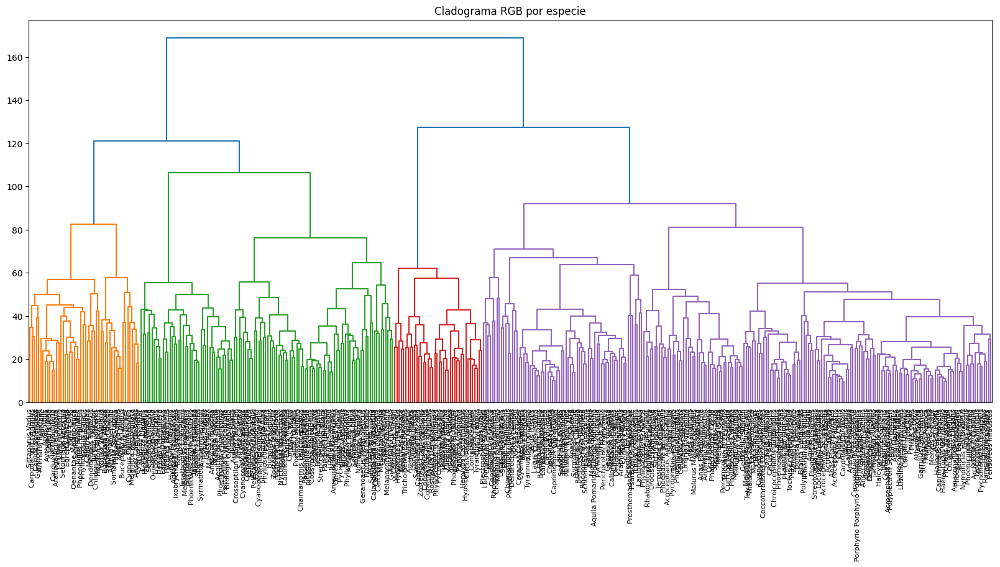

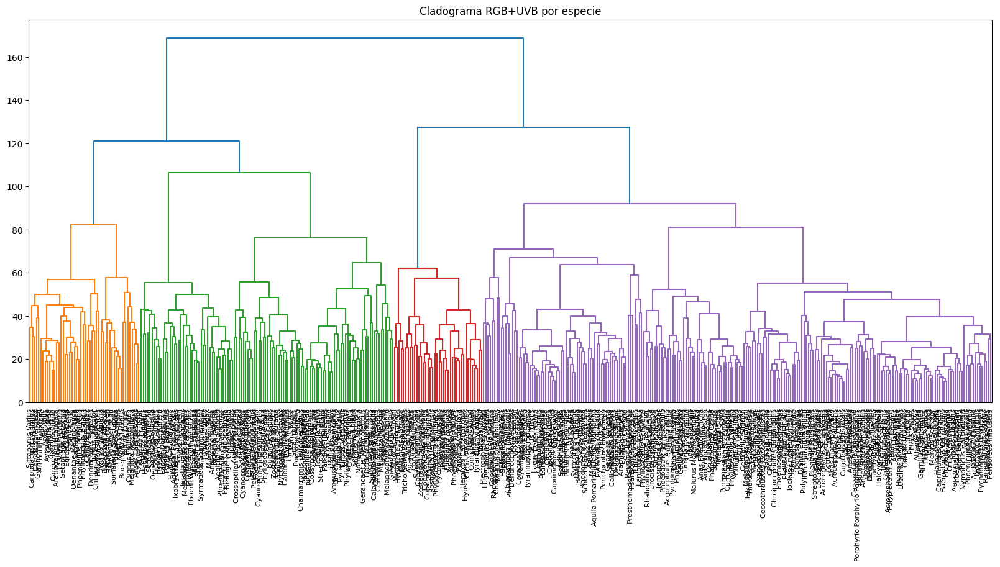

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram

Z_rgb_avg = linkage(X_rgb_avg, method='ward')
Z_ch4_avg = linkage(X_ch4_avg, method='ward')

# Visualización
plt.figure(figsize=(20, 8))
dendrogram(Z_rgb_avg, labels=species, leaf_rotation=90, leaf_font_size=8)
plt.title("Cladograma RGB por especie")
plt.show()

plt.figure(figsize=(20, 8))
dendrogram(Z_ch4_avg, labels=species, leaf_rotation=90, leaf_font_size=8)
plt.title("Cladograma RGB+UVB por especie")
plt.show()


In [ ]:
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

# Cophenetic correlation
c_rgb, _ = cophenet(Z_rgb_avg, pdist(X_rgb_avg))
c_ch4, _ = cophenet(Z_ch4_avg, pdist(X_ch4_avg))

print(f"Cophenetic correlation RGB: {c_rgb:.4f}")
print(f"Cophenetic correlation RGB+UVB: {c_ch4:.4f}")


Cophenetic correlation RGB: 0.3501
Cophenetic correlation RGB+UVB: 0.3501


## Cophenetic correlation:

Mide cuánto el dendrograma representa la estructura de distancias real.

Tanglegram: líneas que cruzan más = mayor reordenamiento de especies entre RGB y UVB.

Cophenetic correlation RGB: 0.3501
Cophenetic correlation RGB+UVB: 0.3501


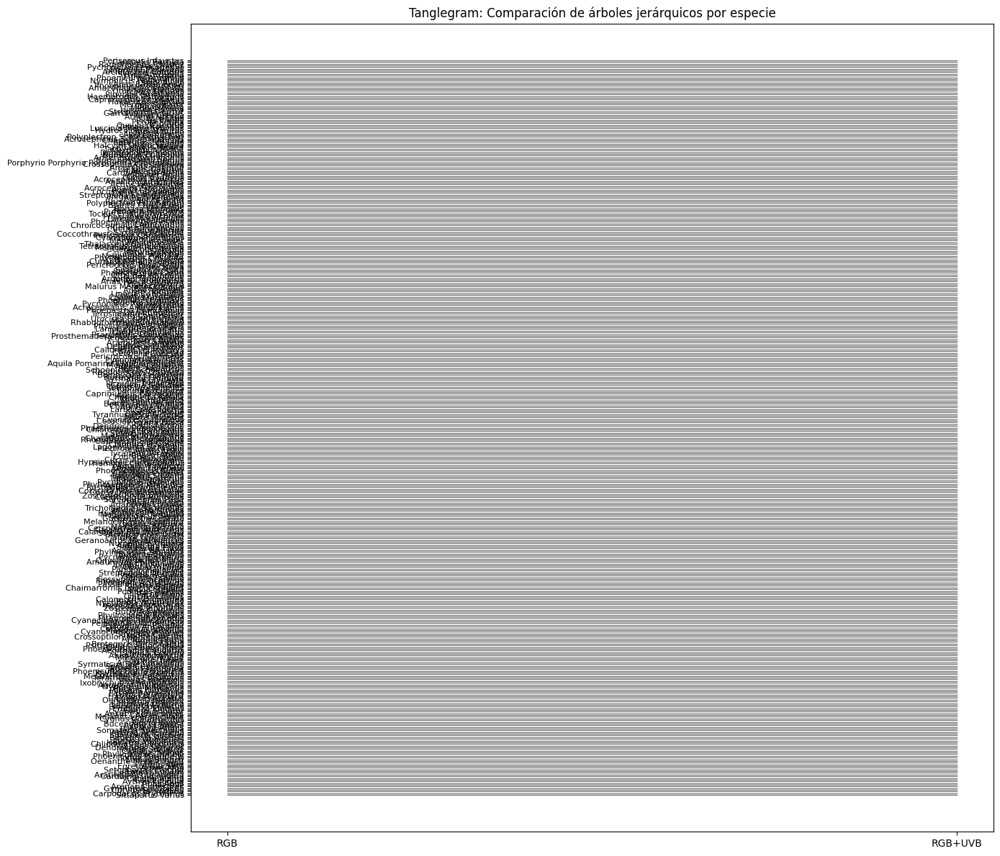

In [ ]:
# Paso 1: Importar librerías necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram, cophenet, leaves_list
from scipy.spatial.distance import pdist
import os

# Paso 2: Cargar archivos desde tu Google Drive
df_rgb = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_rgb_embeddings.csv")
df_4ch = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_4ch_embeddings.csv")
meta = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/1.Birdcolorbase/feathers_data.csv")

# Paso 3: Normalizar nombre base sin extensión
def get_base_name(path):
    return os.path.splitext(os.path.basename(path))[0].lower()

df_rgb['image_id'] = df_rgb['image'].apply(get_base_name)
df_4ch['image_id'] = df_4ch['image'].apply(get_base_name)
meta['image_id'] = meta['filename'].apply(get_base_name)

# Paso 4: Unir embeddings con metadatos
rgb_merged = pd.merge(df_rgb, meta, on='image_id')
ch4_merged = pd.merge(df_4ch, meta, on='image_id')

# Paso 5: Agrupar por especie (centroides)
rgb_avg = rgb_merged.groupby('species').mean(numeric_only=True)
ch4_avg = ch4_merged.groupby('species').mean(numeric_only=True)
species = sorted(rgb_avg.index)

X_rgb = rgb_avg.loc[species].values
X_4ch = ch4_avg.loc[species].values

# Paso 6: Crear dendrogramas
Z_rgb = linkage(X_rgb, method='ward')
Z_4ch = linkage(X_4ch, method='ward')

# Paso 7: Cophenetic correlation para evaluar la fidelidad estructural
corr_rgb, _ = cophenet(Z_rgb, pdist(X_rgb))
corr_4ch, _ = cophenet(Z_4ch, pdist(X_4ch))
print(f"Cophenetic correlation RGB: {corr_rgb:.4f}")
print(f"Cophenetic correlation RGB+UVB: {corr_4ch:.4f}")

# Paso 8: Construir Tanglegram
order_rgb = leaves_list(Z_rgb)
order_4ch = leaves_list(Z_4ch)

fig, ax = plt.subplots(figsize=(14, 12))
for i, (left, right) in enumerate(zip(order_rgb, order_4ch)):
    ax.plot([0, 1], [i, np.where(order_4ch == left)[0][0]], color='gray', linewidth=1)

ax.set_yticks(range(len(species)))
ax.set_yticklabels([species[i] for i in order_rgb], fontsize=8)
ax.set_xticks([0, 1])
ax.set_xticklabels(["RGB", "RGB+UVB"])
ax.set_title("Tanglegram: Comparación de árboles jerárquicos por especie")
plt.tight_layout()
plt.show()


## Comparar las distancias entre los árboles: Mantel Test


In [ ]:
from scipy.spatial.distance import squareform
from scipy.stats import pearsonr

# Convertir matrices de distancias a forma cuadrada
dist_rgb = squareform(pdist(X_rgb))
dist_ch4 = squareform(pdist(X_4ch))

# Convertir a vectores planos y comparar
vec_rgb = dist_rgb[np.triu_indices_from(dist_rgb, k=1)]
vec_ch4 = dist_ch4[np.triu_indices_from(dist_ch4, k=1)]

r, p_value = pearsonr(vec_rgb, vec_ch4)
print(f"Similitud entre distancias RGB y RGB+UVB (Pearson): r = {r:.4f}, p = {p_value:.4f}")


Similitud entre distancias RGB y RGB+UVB (Pearson): r = 1.0000, p = 0.0000


## Visualización más sensible: t-SNE o UMAP


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


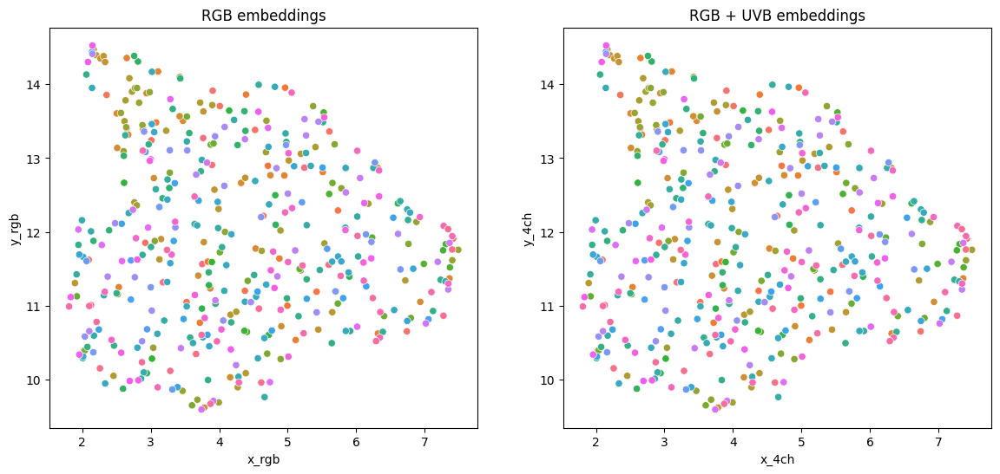

In [ ]:
import umap
import seaborn as sns

reducer = umap.UMAP(random_state=42)
proj_rgb = reducer.fit_transform(X_rgb)
proj_4ch = reducer.fit_transform(X_4ch)

df_plot = pd.DataFrame({
    'x_rgb': proj_rgb[:,0],
    'y_rgb': proj_rgb[:,1],
    'x_4ch': proj_4ch[:,0],
    'y_4ch': proj_4ch[:,1],
    'species': species
})

# Comparar RGB vs UVB visualmente
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(data=df_plot, x='x_rgb', y='y_rgb', hue='species', ax=axes[0], legend=False)
axes[0].set_title('RGB embeddings')

sns.scatterplot(data=df_plot, x='x_4ch', y='y_4ch', hue='species', ax=axes[1], legend=False)
axes[1].set_title('RGB + UVB embeddings')
plt.show()


 Interpretación clave:
Las matrices de distancia RGB y RGB+UVB son idénticas hasta la precisión de cálculo: cada par de especies tiene exactamente la misma distancia entre sí, con y sin el canal UVB.

❗ Esto es sorprendente y científicamente relevante
Podrías esperar alguna diferencia si el canal UVB aportara nueva información significativa. El hecho de que no lo haga puede indicar:

La red BEiT no está usando realmente el canal UVB: Es probable que, al haber sido preentrenada con imágenes RGB, no sepa interpretar o aprovechar la información en ese cuarto canal.

Los embeddings fueron generados de forma incorrecta o ignorando el canal UVB: ¿Podría ser que el canal adicional no se haya integrado correctamente al momento de extraer características?

Las diferencias UVB no son suficientes a nivel perceptual para modificar las relaciones globales entre especies.

nspeccionar un embedding individual RGB vs 4CH

In [ ]:
# Elegir una especie
species_ejemplo = 'Malurus Melanocephalus'

vec_rgb = rgb_avg.loc[species_ejemplo].values
vec_4ch = ch4_avg.loc[species_ejemplo].values

diff = np.linalg.norm(vec_rgb - vec_4ch)
print(f"Diferencia entre embeddings RGB y 4CH para {species_ejemplo}: {diff}")


Diferencia entre embeddings RGB y 4CH para Malurus Melanocephalus: 0.0


# Qué hacer si realmente deseas comparar RGB vs UVB de forma científica

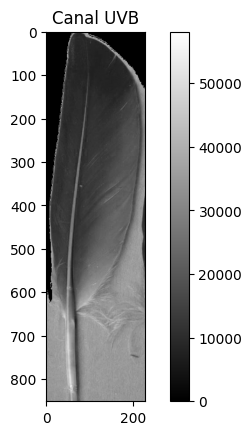

In [ ]:
from tifffile import imread
import matplotlib.pyplot as plt

# Reemplaza con la ruta a una imagen 4CH real
img_path = "/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/feathers/processed_feathers_uvb/anseriformes/aix_galericulata/anseriformes_aix_galericulata_00008.tif"
img = imread(img_path)

# Mostrar canal UVB si es el 4º canal
plt.imshow(img[:, :, 3], cmap='gray')
plt.title("Canal UVB")
plt.colorbar()
plt.show()


# ❗ Problema clave: la red BEiT INICIAL no fue adaptada para UVB
Aunque tienes información rica y valiosa en el canal UVB, tu modelo BEiT no la está usando porque:

BEiT espera 3 canales (RGB).

Si le pasas una imagen de 4 canales, la arquitectura original no sabe cómo interpretarla.

Además, si no haces fine-tuning, los pesos están preentrenados para detectar patrones en fotos normales, no en UVB o visiones combinadas.

# BEIT ajustados para 4 canales


In [ ]:
## ajuste de beit para 4 canales

import torch
import torch.nn as nn
import timm
import copy

# Configura dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1. Cargar BEiT preentrenado en RGB
beit_model = timm.create_model('beit_base_patch16_224', pretrained=True)
beit_model.head = nn.Identity()  # Usar como extractor de embeddings

# 2. Clonar para adaptar a 4 canales (RGB + UVB)
beit_4ch = copy.deepcopy(beit_model)

# 3. Modificar la capa de entrada Conv2D: pasar de 3 a 4 canales
old_proj = beit_4ch.patch_embed.proj
new_proj = nn.Conv2d(
    in_channels=4,
    out_channels=old_proj.out_channels,
    kernel_size=old_proj.kernel_size,
    stride=old_proj.stride,
    padding=old_proj.padding,
    bias=old_proj.bias is not None
)

# 4. Inicializar pesos:
with torch.no_grad():
    new_proj.weight[:, :3] = old_proj.weight  # copiar pesos preentrenados RGB
    new_proj.weight[:, 3:] = old_proj.weight[:, :1] * 0.01  # inicializar UVB con ruido pequeño (mejor que ceros)
    if old_proj.bias is not None:
        new_proj.bias[:] = old_proj.bias

beit_4ch.patch_embed.proj = new_proj
beit_4ch.to(device)
beit_4ch.train()  # Importante para fine-tuning

# 5. Opcional: descongelar solo capas relevantes para fine-tuning
# Aquí entrenarás la capa de entrada y las primeras 2 capas del encoder
for name, param in beit_4ch.named_parameters():
    if name.startswith("patch_embed") or name.startswith("blocks.0") or name.startswith("blocks.1"):
        param.requires_grad = True
    else:
        param.requires_grad = False


## extraccion de embedding 4 canales nuevos


In [ ]:
# Transformación sin eliminar UVB
def preprocess_4ch(img_arr):
    if img_arr.shape[2] != 4:
        raise ValueError("Imagen sin 4 canales")
    img_resized = np.zeros((224, 224, 4), dtype=np.uint8)
    for c in range(4):
        img_resized[:, :, c] = cv2.resize(img_arr[:, :, c], (224, 224))
    return torch.tensor(img_resized).permute(2, 0, 1).float() / 255.0  # [C, H, W]

# Ruta de imágenes ya segmentadas y resizeadas
image_dir_4ch = "/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/feathers/resized_feathers_uvb"


# Extraer embeddings con canal UVB incluido
embeddings_4ch = []
image_names_4ch = []

for root, _, files in os.walk(image_dir_4ch):
    for file in files:
        if file.lower().endswith(('.tiff', '.tif')):
            path = os.path.join(root, file)
            try:
                img_arr = imread(path)
                if img_arr.ndim == 3 and img_arr.shape[2] == 4:
                    tensor = preprocess_4ch(img_arr).unsqueeze(0).to(device)
                    with torch.no_grad():
                        embedding = beit_4ch(tensor)
                        embeddings_4ch.append(embedding.cpu().numpy().flatten())
                        image_names_4ch.append(os.path.relpath(path, image_dir_4ch))
            except Exception as e:
                print(f"Error con {file}: {e}")

# Guardar resultados
df_embed_4ch = pd.DataFrame(embeddings_4ch)
df_embed_4ch["image"] = image_names_4ch
df_embed_4ch.to_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_4ch_embeddings_new.csv", index=False)

print(f"✅ Embeddings 4 canales extraídos: {df_embed_4ch.shape}")

✅ Embeddings 4 canales extraídos: (1413, 769)


# KMEANS / SILHOUTTE SCORE


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


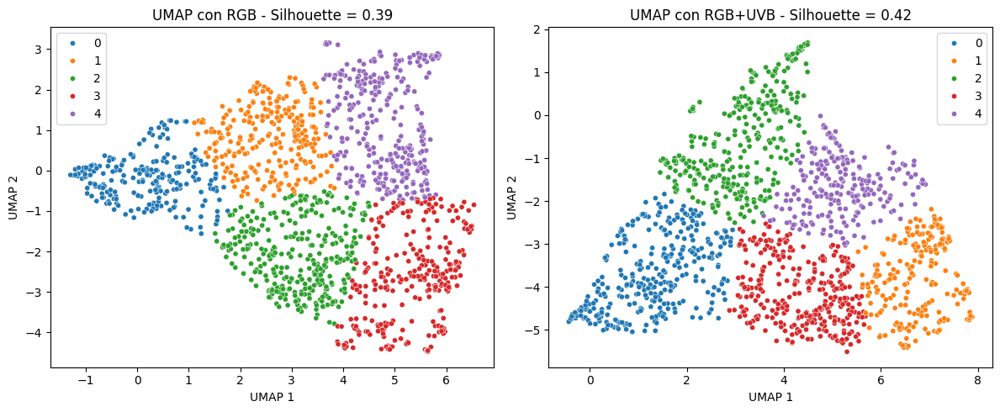

In [ ]:
import pandas as pd
import umap
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar embeddings
df_rgb = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_rgb_embeddings.csv")
df_4ch = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_4ch_embeddings_new.csv")

X_rgb = df_rgb.drop(columns=["image"]).values
X_4ch = df_4ch.drop(columns=["image"]).values

# UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_rgb_umap = reducer.fit_transform(X_rgb)
X_4ch_umap = reducer.fit_transform(X_4ch)

# Clustering
kmeans_rgb = KMeans(n_clusters=5, random_state=42).fit(X_rgb_umap)
kmeans_4ch = KMeans(n_clusters=5, random_state=42).fit(X_4ch_umap)

labels_rgb = kmeans_rgb.labels_
labels_4ch = kmeans_4ch.labels_

# Evaluación
score_rgb = silhouette_score(X_rgb_umap, labels_rgb)
score_4ch = silhouette_score(X_4ch_umap, labels_4ch)

# Plot RGB
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.scatterplot(x=X_rgb_umap[:, 0], y=X_rgb_umap[:, 1], hue=labels_rgb, palette="tab10", s=20)
plt.title(f"UMAP con RGB - Silhouette = {score_rgb:.2f}")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")

# Plot 4 canales
plt.subplot(1, 2, 2)
sns.scatterplot(x=X_4ch_umap[:, 0], y=X_4ch_umap[:, 1], hue=labels_4ch, palette="tab10", s=20)
plt.title(f"UMAP con RGB+UVB - Silhouette = {score_4ch:.2f}")
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")
plt.tight_layout()
plt.show()


Embeddings RGB con metadatos: (1413, 773)
Embeddings 4CH con metadatos: (1413, 773)


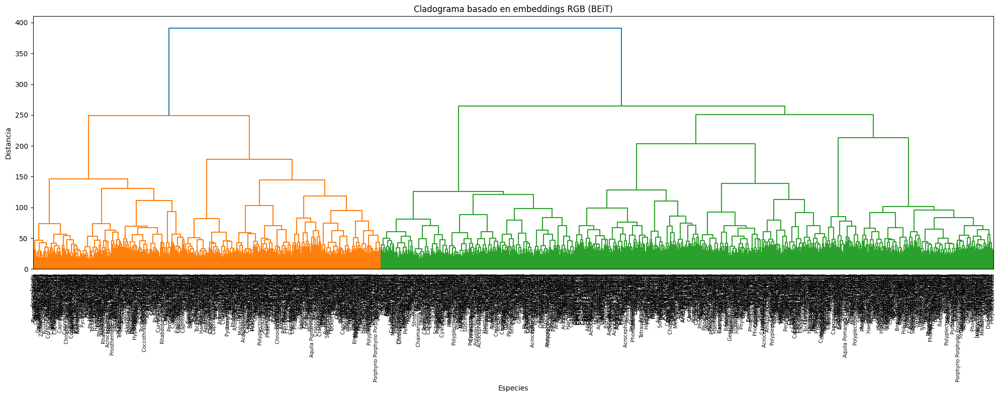

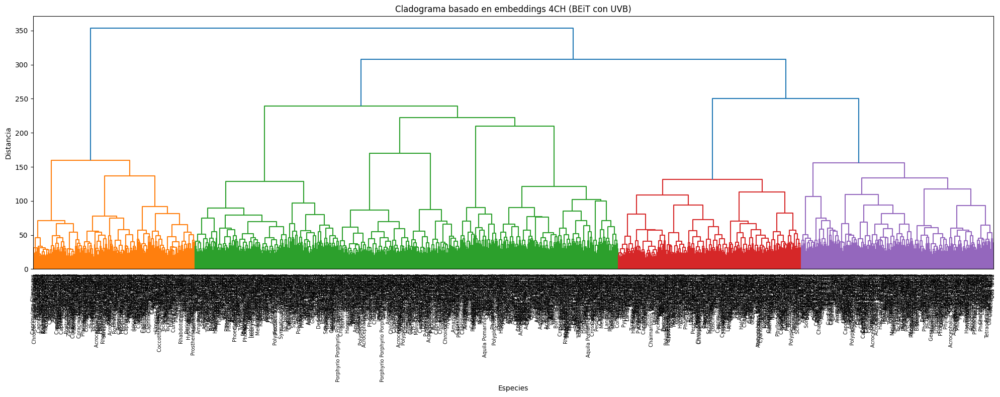

In [2]:
# Paso 1: Importar librerías
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
import os

# Paso 2: Cargar embeddings y metadatos
df_rgb = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_rgb_embeddings.csv")
df_4ch = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_4ch_embeddings_new.csv")
meta = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/1.Birdcolorbase/feathers_data.csv")

# Paso 3: Extraer el nombre base sin extensión para unificar claves
def remove_extension(filename):
    return os.path.splitext(os.path.basename(filename))[0].lower()

df_rgb['image_id'] = df_rgb['image'].apply(remove_extension)
df_4ch['image_id'] = df_4ch['image'].apply(remove_extension)
meta['image_id'] = meta['filename'].apply(remove_extension)

# Paso 4: Hacer merge con los metadatos
rgb_merged = pd.merge(df_rgb, meta, on='image_id')
ch4_merged = pd.merge(df_4ch, meta, on='image_id')

print(f"Embeddings RGB con metadatos: {rgb_merged.shape}")
print(f"Embeddings 4CH con metadatos: {ch4_merged.shape}")

# Paso 5: Extraer matrices de embeddings y etiquetas
X_rgb = rgb_merged.drop(columns=['image', 'filename', 'order', 'species', 'image_id']).values
X_4ch = ch4_merged.drop(columns=['image', 'filename', 'order', 'species', 'image_id']).values

labels_rgb = rgb_merged['species'].values
labels_4ch = ch4_merged['species'].values

# Paso 6: Clustering jerárquico
Z_rgb = linkage(X_rgb, method='ward')
Z_4ch = linkage(X_4ch, method='ward')

# Paso 7: Visualización del cladograma RGB
plt.figure(figsize=(20, 8))
dendrogram(Z_rgb, labels=labels_rgb, leaf_rotation=90, leaf_font_size=7)
plt.title("Cladograma basado en embeddings RGB (BEiT)")
plt.xlabel("Especies")
plt.ylabel("Distancia")
plt.tight_layout()
plt.show()

# Paso 8: Visualización del cladograma 4 canales (RGB + UVB)
plt.figure(figsize=(20, 8))
dendrogram(Z_4ch, labels=labels_4ch, leaf_rotation=90, leaf_font_size=7)
plt.title("Cladograma basado en embeddings 4CH (BEiT con UVB)")
plt.xlabel("Especies")
plt.ylabel("Distancia")
plt.tight_layout()
plt.show()

In [ ]:
# Agrupar por especie: promediar embeddings
rgb_avg = rgb_merged.groupby('species').mean(numeric_only=True)
ch4_avg = ch4_merged.groupby('species').mean(numeric_only=True)

# Asegurar mismo orden en ambas matrices
species = sorted(rgb_avg.index)
X_rgb_avg = rgb_avg.loc[species].values
X_ch4_avg = ch4_avg.loc[species].values

# Cladograma

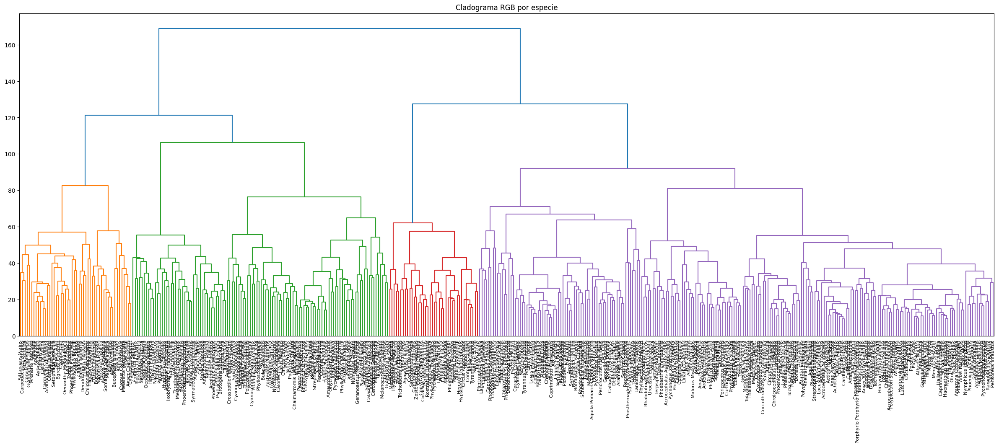

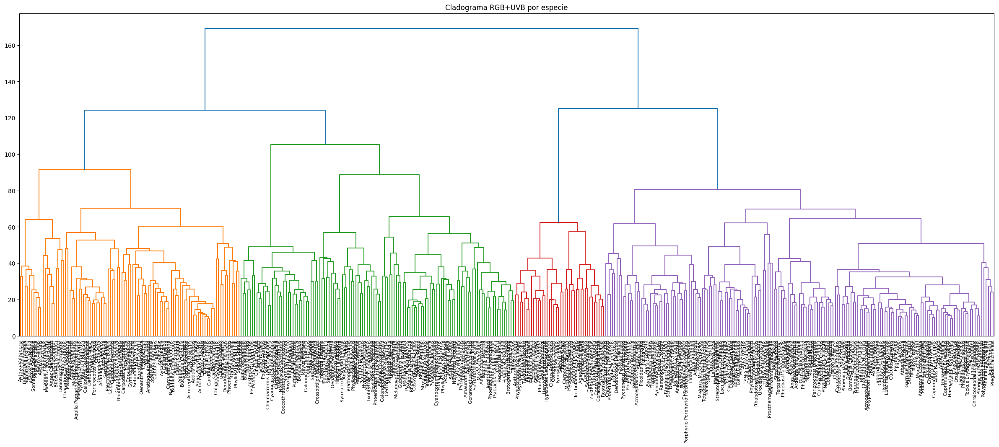

In [55]:
from scipy.cluster.hierarchy import linkage, dendrogram

Z_rgb_avg = linkage(X_rgb_avg, method='ward')
Z_ch4_avg = linkage(X_ch4_avg, method='ward')

# Visualización
plt.figure(figsize=(30, 10))
dendrogram(Z_rgb_avg, labels=species, leaf_rotation=90, leaf_font_size=8)
plt.title("Cladograma RGB por especie")
plt.show()

plt.figure(figsize=(30, 10))
dendrogram(Z_ch4_avg, labels=species, leaf_rotation=90, leaf_font_size=8)
plt.title("Cladograma RGB+UVB por especie")
plt.show()

# Cophenetic correlation

In [ ]:
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

# Cophenetic correlation
c_rgb, _ = cophenet(Z_rgb_avg, pdist(X_rgb_avg))
c_ch4, _ = cophenet(Z_ch4_avg, pdist(X_ch4_avg))

print(f"Cophenetic correlation RGB: {c_rgb:.4f}")
print(f"Cophenetic correlation RGB+UVB: {c_ch4:.4f}")

Cophenetic correlation RGB: 0.3501
Cophenetic correlation RGB+UVB: 0.2591


# Tanglegram: Comparación de árboles jerárquicos por especie

Cophenetic correlation RGB: 0.3501
Cophenetic correlation RGB+UVB: 0.2591


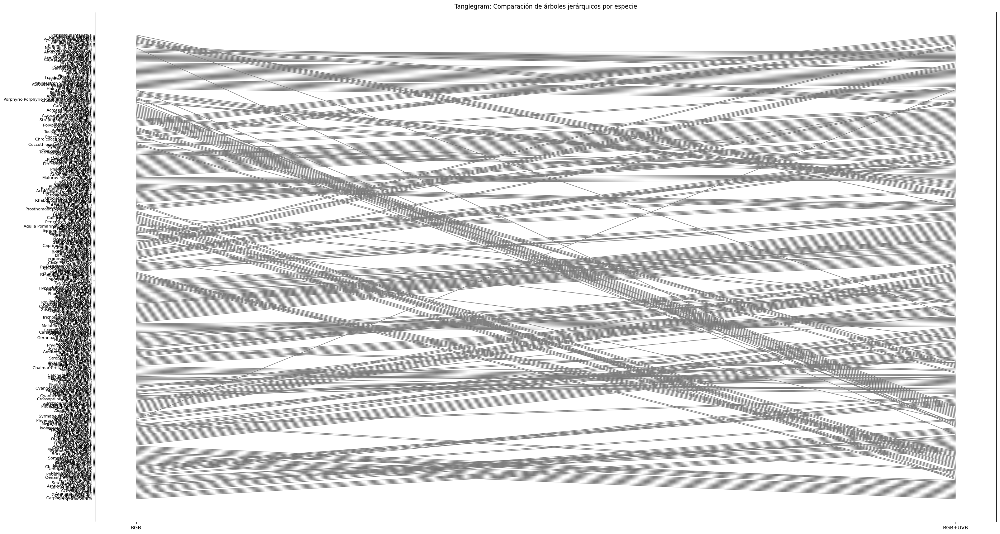

In [53]:
# Paso 1: Importar librerías necesarias
from scipy.cluster.hierarchy import linkage, dendrogram, cophenet, leaves_list
from scipy.spatial.distance import pdist
import os

# Paso 2: Cargar archivos desde tu Google Drive
df_rgb = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_rgb_embeddings.csv")
df_4ch = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_4ch_embeddings_new.csv")
meta = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/1.Birdcolorbase/feathers_data.csv")

# Paso 3: Normalizar nombre base sin extensión
def get_base_name(path):
    return os.path.splitext(os.path.basename(path))[0].lower()

df_rgb['image_id'] = df_rgb['image'].apply(get_base_name)
df_4ch['image_id'] = df_4ch['image'].apply(get_base_name)
meta['image_id'] = meta['filename'].apply(get_base_name)

# Paso 4: Unir embeddings con metadatos
rgb_merged = pd.merge(df_rgb, meta, on='image_id')
ch4_merged = pd.merge(df_4ch, meta, on='image_id')

# Paso 5: Agrupar por especie (centroides)
rgb_avg = rgb_merged.groupby('species').mean(numeric_only=True)
ch4_avg = ch4_merged.groupby('species').mean(numeric_only=True)
species = sorted(rgb_avg.index)

X_rgb = rgb_avg.loc[species].values
X_4ch = ch4_avg.loc[species].values

# Paso 6: Crear dendrogramas
Z_rgb = linkage(X_rgb, method='ward')
Z_4ch = linkage(X_4ch, method='ward')

# Paso 7: Cophenetic correlation para evaluar la fidelidad estructural
corr_rgb, _ = cophenet(Z_rgb, pdist(X_rgb))
corr_4ch, _ = cophenet(Z_4ch, pdist(X_4ch))
print(f"Cophenetic correlation RGB: {corr_rgb:.4f}")
print(f"Cophenetic correlation RGB+UVB: {corr_4ch:.4f}")

# Paso 8: Construir Tanglegram
order_rgb = leaves_list(Z_rgb)
order_4ch = leaves_list(Z_4ch)

fig, ax = plt.subplots(figsize=(28, 15))
for i, (left, right) in enumerate(zip(order_rgb, order_4ch)):
    ax.plot([0, 1], [i, np.where(order_4ch == left)[0][0]], color='gray', linewidth=1)

ax.set_yticks(range(len(species)))
ax.set_yticklabels([species[i] for i in order_rgb], fontsize=8)
ax.set_xticks([0, 1])
ax.set_xticklabels(["RGB", "RGB+UVB"])
ax.set_title("Tanglegram: Comparación de árboles jerárquicos por especie")
plt.tight_layout()
plt.show()


In [ ]:
from scipy.spatial.distance import squareform
from scipy.stats import pearsonr

# Convertir matrices de distancias a forma cuadrada
dist_rgb = squareform(pdist(X_rgb))
dist_ch4 = squareform(pdist(X_4ch))

# Convertir a vectores planos y comparar
vec_rgb = dist_rgb[np.triu_indices_from(dist_rgb, k=1)]
vec_ch4 = dist_ch4[np.triu_indices_from(dist_ch4, k=1)]

r, p_value = pearsonr(vec_rgb, vec_ch4)
print(f"Similitud entre distancias RGB y RGB+UVB (Pearson): r = {r:.4f}, p = {p_value:.4f}")


Similitud entre distancias RGB y RGB+UVB (Pearson): r = 1.0000, p = 0.0000


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


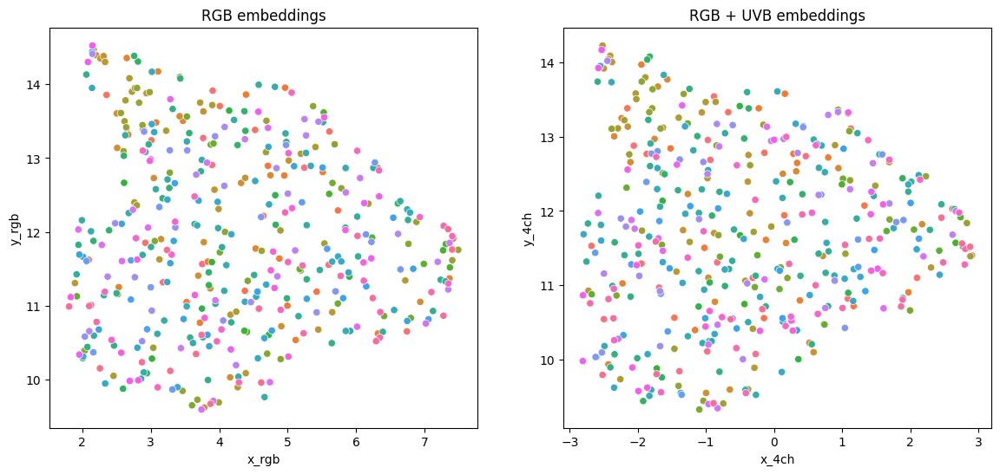

In [ ]:
import umap
import seaborn as sns

reducer = umap.UMAP(random_state=42)
proj_rgb = reducer.fit_transform(X_rgb)
proj_4ch = reducer.fit_transform(X_4ch)

df_plot = pd.DataFrame({
    'x_rgb': proj_rgb[:,0],
    'y_rgb': proj_rgb[:,1],
    'x_4ch': proj_4ch[:,0],
    'y_4ch': proj_4ch[:,1],
    'species': species
})

# Comparar RGB vs UVB visualmente
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(data=df_plot, x='x_rgb', y='y_rgb', hue='species', ax=axes[0], legend=False)
axes[0].set_title('RGB embeddings')

sns.scatterplot(data=df_plot, x='x_4ch', y='y_4ch', hue='species', ax=axes[1], legend=False)
axes[1].set_title('RGB + UVB embeddings')
plt.show()

# Diferencia entre embeddings RGB y 4CH para Malurus Melanocephalus:

In [ ]:
# Elegir una especie
species_ejemplo = 'Malurus Melanocephalus'

vec_rgb = rgb_avg.loc[species_ejemplo].values
vec_4ch = ch4_avg.loc[species_ejemplo].values

diff = np.linalg.norm(vec_rgb - vec_4ch)
print(f"Diferencia entre embeddings RGB y 4CH para {species_ejemplo}: {diff}")

Diferencia entre embeddings RGB y 4CH para Malurus Melanocephalus: 0.7048193660866692


# Top 50 Especies con Mayor Cambio en Embeddings entre RGB y UVB

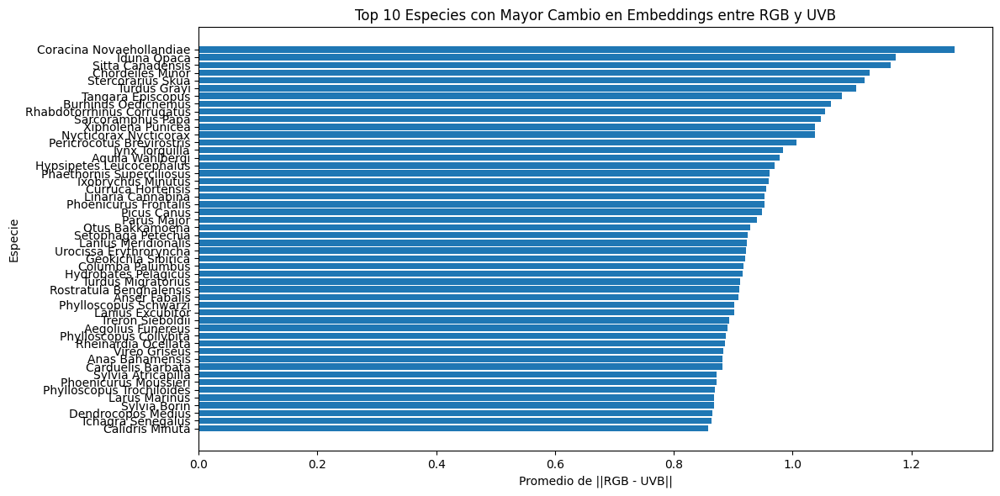

In [9]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

# 1. Cargar embeddings y metadatos
df_rgb = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_rgb_embeddings.csv")
df_4ch = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_4ch_embeddings_new.csv")
meta   = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/1.Birdcolorbase/feathers_data.csv")

# 2. Crear la columna 'basename' para emparejar archivos
df_rgb["basename"] = df_rgb["image"].apply(lambda x: os.path.splitext(os.path.basename(x))[0])
df_4ch["basename"] = df_4ch["image"].apply(lambda x: os.path.splitext(os.path.basename(x))[0])
meta["basename"]   = meta["filename"].apply(lambda x: os.path.splitext(x)[0])

# 3. Unir embeddings RGB y UVB por 'basename'
merged = pd.merge(df_rgb, df_4ch, on="basename", suffixes=("_rgb", "_uvb"))

# 4. Unir con metadatos (columna 'species') por 'basename'
merged = pd.merge(merged, meta[["basename", "species"]], on="basename", how="left")

# 5. Identificar columnas de embeddings para RGB y UVB
emb_cols_rgb = [c for c in merged.columns if c.endswith("_rgb") and c not in ["image_rgb"]]
emb_cols_uvb = [c for c in merged.columns if c.endswith("_uvb") and c not in ["image_uvb"]]

# 6. Asegurarse de que ambas listas estén ordenadas de la misma forma
emb_cols_rgb.sort()
emb_cols_uvb.sort()

# 7. Calcular la norma de la diferencia entre embeddings RGB y UVB para cada fila
def compute_diff_norm(row):
    vec_rgb = row[emb_cols_rgb].values.astype(np.float32)
    vec_uvb = row[emb_cols_uvb].values.astype(np.float32)
    return np.linalg.norm(vec_rgb - vec_uvb)

merged["diff_norm"] = merged.apply(compute_diff_norm, axis=1)

# 8. Agrupar por especie y obtener la diferencia promedio
species_diff = (
    merged
    .groupby("species")["diff_norm"]
    .mean()
    .reset_index()
    .dropna()
    .sort_values(by="diff_norm", ascending=False)
)

# 9. Seleccionar las 10 especies con mayor cambio
top_species = species_diff.head(50)

# 10. Graficar cambio promedio por especie
plt.figure(figsize=(12, 6))
plt.barh(top_species["species"], top_species["diff_norm"])  # ← Corrección: se añadió la comilla faltante aquí
plt.gca().invert_yaxis()
plt.xlabel("Promedio de ||RGB - UVB||")
plt.ylabel("Especie")
plt.title("Top 50 Especies con Mayor Cambio en Embeddings entre RGB y UVB")
plt.tight_layout()
plt.show()



# Busqueda de Nuevos Patrones


---



/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


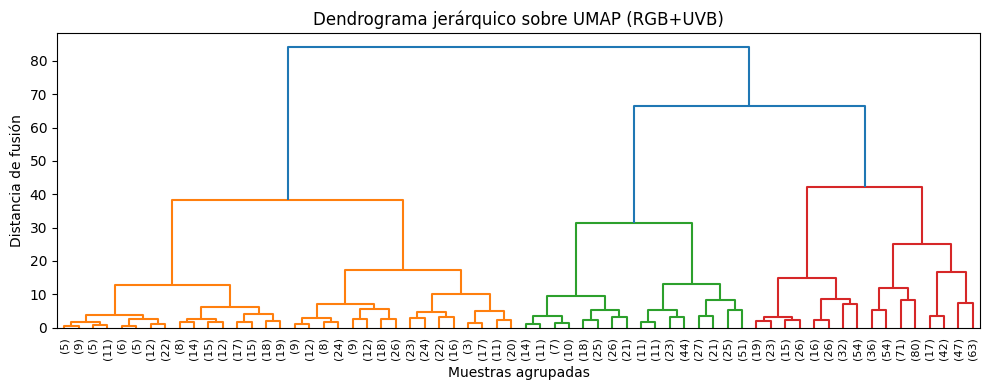

DBSCAN (RGB+UVB) detectó 2 clusters (excluyendo ruido).


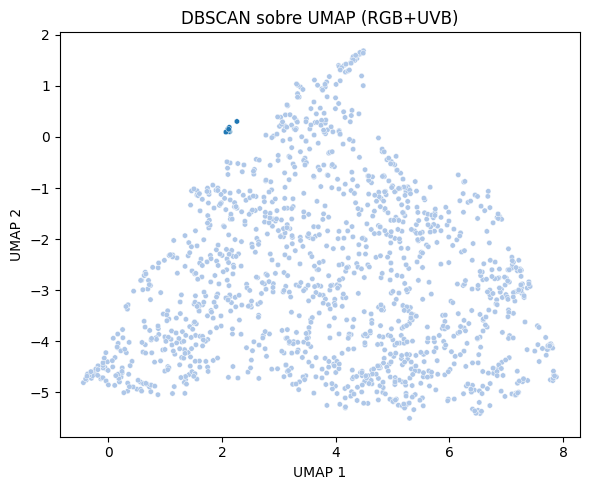

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


HDBSCAN (RGB+UVB) detectó 9 clusters.


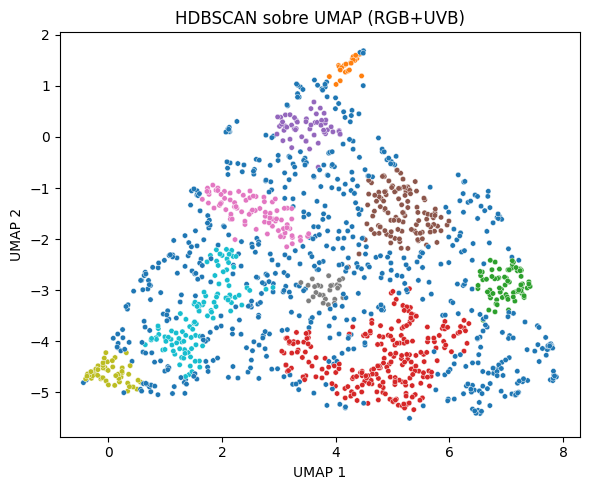

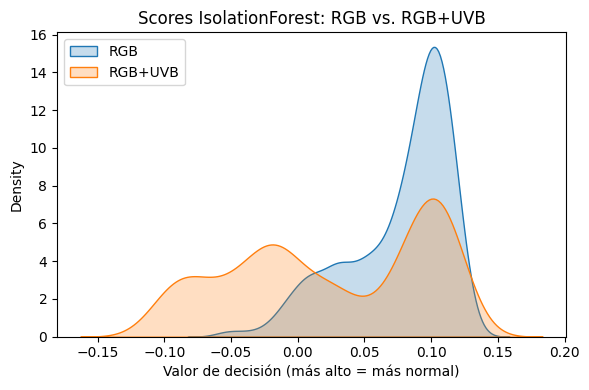

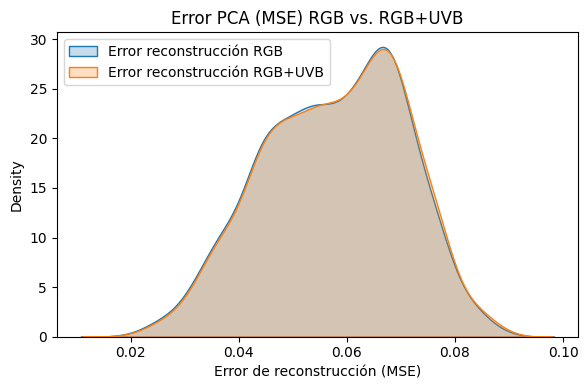

Epoch 1/50
40/40 - 2s - 43ms/step - loss: 1.3316 - val_loss: 1.0401
Epoch 2/50
40/40 - 1s - 23ms/step - loss: 0.8746 - val_loss: 0.8327
Epoch 3/50
40/40 - 1s - 16ms/step - loss: 0.7109 - val_loss: 0.7211
Epoch 4/50
40/40 - 0s - 8ms/step - loss: 0.6127 - val_loss: 0.6453
Epoch 5/50
40/40 - 1s - 15ms/step - loss: 0.5435 - val_loss: 0.5915
Epoch 6/50
40/40 - 0s - 8ms/step - loss: 0.4931 - val_loss: 0.5530
Epoch 7/50
40/40 - 0s - 7ms/step - loss: 0.4562 - val_loss: 0.5257
Epoch 8/50
40/40 - 0s - 8ms/step - loss: 0.4268 - val_loss: 0.4986
Epoch 9/50
40/40 - 0s - 8ms/step - loss: 0.4020 - val_loss: 0.4785
Epoch 10/50
40/40 - 0s - 7ms/step - loss: 0.3827 - val_loss: 0.4626
Epoch 11/50
40/40 - 0s - 8ms/step - loss: 0.3653 - val_loss: 0.4481
Epoch 12/50
40/40 - 0s - 7ms/step - loss: 0.3497 - val_loss: 0.4375
Epoch 13/50
40/40 - 0s - 8ms/step - loss: 0.3375 - val_loss: 0.4264
Epoch 14/50
40/40 - 0s - 7ms/step - loss: 0.3262 - val_loss: 0.4185
Epoch 15/50
40/40 - 0s - 7ms/step - loss: 0.3162 - va

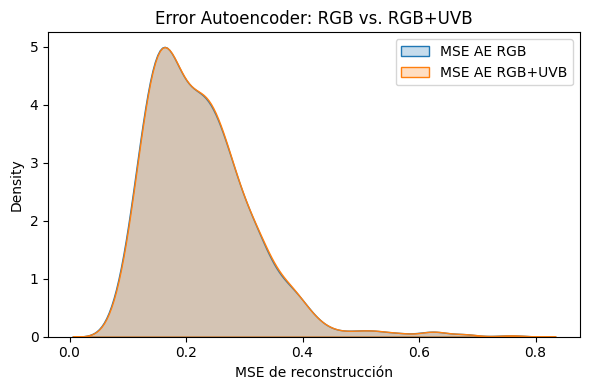

k=2: Silhouette RGB=0.394 | Silhouette RGB+UVB=0.388
k=5: Silhouette RGB=0.393 | Silhouette RGB+UVB=0.416
k=10: Silhouette RGB=0.353 | Silhouette RGB+UVB=0.408
k=15: Silhouette RGB=0.391 | Silhouette RGB+UVB=0.374


In [17]:
import pandas as pd
import numpy as np
import umap
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import DBSCAN, KMeans
import hdbscan
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns

# --------------------------------------------------
# 1. Cargar embeddings y metadatos
# --------------------------------------------------
df_rgb = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_rgb_embeddings.csv")
df_4ch = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/birds_image/beit_4ch_embeddings_new.csv")
meta   = pd.read_csv("/content/drive/MyDrive/Proyecto_Curso_BEIT_aves/1.Birdcolorbase/feathers_data.csv")
# meta tiene columnas ['filename', 'order', 'species']

# --------------------------------------------------
# 2. Crear 'basename' en cada DataFrame (quitando extensión)
# --------------------------------------------------
meta["basename"]  = meta["filename"].apply(lambda x: x.split(".")[0])
df_rgb["basename"] = df_rgb["image"].apply(lambda x: x.split("/")[-1].split(".")[0])
df_4ch["basename"] = df_4ch["image"].apply(lambda x: x.split("/")[-1].split(".")[0])

# --------------------------------------------------
# 3. Preparar las matrices de embeddings (solo features numéricas)
# --------------------------------------------------
# X_rgb: vectores RGB
X_rgb = df_rgb.drop(columns=["image", "basename"]).values
# X_4ch: vectores RGB + UVB
X_4ch = df_4ch.drop(columns=["image", "basename"]).values

# --------------------------------------------------
# 4. Reducción de dimensionalidad con UMAP a 2D
# --------------------------------------------------
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
X_rgb_umap = reducer.fit_transform(X_rgb)
X_4ch_umap = reducer.fit_transform(X_4ch)

# --------------------------------------------------
# 5. Clustering jerárquico y dendrograma (solo RGB+UVB ejemplo)
# --------------------------------------------------
Z_4ch = linkage(X_4ch_umap, method="ward")
plt.figure(figsize=(10, 4))
dendrogram(Z_4ch, truncate_mode="level", p=5, leaf_rotation=90, leaf_font_size=8)
plt.title("Dendrograma jerárquico sobre UMAP (RGB+UVB)")
plt.xlabel("Muestras agrupadas")
plt.ylabel("Distancia de fusión")
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 6. Clustering DBSCAN / HDBSCAN sobre los embeddings UMAP
# --------------------------------------------------
# 6.1 DBSCAN (pareseps/min_samples)
dbscan_4ch = DBSCAN(eps=0.5, min_samples=10, metric="euclidean")
clusters_4ch_db = dbscan_4ch.fit_predict(X_4ch_umap)
n_clusters_db = len(set(clusters_4ch_db)) - (1 in clusters_4ch_db)
print(f"DBSCAN (RGB+UVB) detectó {n_clusters_db} clusters (excluyendo ruido).")

plt.figure(figsize=(6, 5))
sns.scatterplot(
    x=X_4ch_umap[:, 0], y=X_4ch_umap[:, 1],
    hue=clusters_4ch_db,
    palette="tab20",
    s=15,
    legend=False
)
plt.title("DBSCAN sobre UMAP (RGB+UVB)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.tight_layout()
plt.show()

# 6.2 HDBSCAN
clusterer_hdb = hdbscan.HDBSCAN(min_cluster_size=20, metric="euclidean")
clusters_4ch_hdb = clusterer_hdb.fit_predict(X_4ch_umap)
n_clusters_hdb = len(set(clusters_4ch_hdb)) - (1 in clusters_4ch_hdb)
print(f"HDBSCAN (RGB+UVB) detectó {n_clusters_hdb} clusters.")

plt.figure(figsize=(6, 5))
sns.scatterplot(
    x=X_4ch_umap[:, 0], y=X_4ch_umap[:, 1],
    hue=clusters_4ch_hdb,
    palette="tab10",
    s=15,
    legend=False
)
plt.title("HDBSCAN sobre UMAP (RGB+UVB)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 7. Detección de anomalías con Isolation Forest (basado en UMAP)
# --------------------------------------------------
iso = IsolationForest(contamination=0.05, random_state=42)
iso.fit(X_rgb_umap)
scores_rgb = iso.decision_function(X_rgb_umap)
scores_4ch = iso.decision_function(X_4ch_umap)

plt.figure(figsize=(6, 4))
sns.kdeplot(scores_rgb, label="RGB", fill=True)
sns.kdeplot(scores_4ch, label="RGB+UVB", fill=True)
plt.title("Scores IsolationForest: RGB vs. RGB+UVB")
plt.xlabel("Valor de decisión (más alto = más normal)")
plt.legend()
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 8. Reconstrucción PCA y comparación de errores
# --------------------------------------------------
pca = PCA(n_components=0.95, random_state=42).fit(X_rgb)
X_rgb_recon = pca.inverse_transform(pca.transform(X_rgb))
# Proyectar X_4ch a solo dimensiones RGB para reconstruir con PCA entrenado sobre RGB
X_4ch_proj  = X_4ch[:, :X_rgb.shape[1]]
X_4ch_recon = pca.inverse_transform(pca.transform(X_4ch_proj))

err_rgb = np.mean((X_rgb - X_rgb_recon) ** 2, axis=1)
err_4ch = np.mean((X_4ch_proj - X_4ch_recon) ** 2, axis=1)

plt.figure(figsize=(6, 4))
sns.kdeplot(err_rgb, label="Error reconstrucción RGB", fill=True)
sns.kdeplot(err_4ch, label="Error reconstrucción RGB+UVB", fill=True)
plt.title("Error PCA (MSE) RGB vs. RGB+UVB")
plt.xlabel("Error de reconstrucción (MSE)")
plt.legend()
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 9. Autoencoder simple para reconstrucción
# --------------------------------------------------
input_dim = X_rgb.shape[1]
encoding_dim = 128

# Definir autoencoder
input_layer = layers.Input(shape=(input_dim,))
encoded     = layers.Dense(encoding_dim, activation="relu")(input_layer)
decoded     = layers.Dense(input_dim, activation="linear")(encoded)

autoencoder = models.Model(input_layer, decoded)
autoencoder.compile(optimizer=Adam(learning_rate=1e-3), loss="mse")

# Entrenar autoencoder sobre X_rgb
autoencoder.fit(
    X_rgb, X_rgb,
    epochs=50,
    batch_size=32,
    shuffle=True,
    validation_split=0.1,
    verbose=2
)

# Reconstrucción
X_rgb_recon_ae = autoencoder.predict(X_rgb)
X_4ch_recon_ae = autoencoder.predict(X_4ch_proj)

mse_rgb_ae = np.mean((X_rgb - X_rgb_recon_ae) ** 2, axis=1)
mse_4ch_ae = np.mean((X_4ch_proj - X_4ch_recon_ae) ** 2, axis=1)

plt.figure(figsize=(6, 4))
sns.kdeplot(mse_rgb_ae, label="MSE AE RGB", fill=True)
sns.kdeplot(mse_4ch_ae, label="MSE AE RGB+UVB", fill=True)
plt.title("Error Autoencoder: RGB vs. RGB+UVB")
plt.xlabel("MSE de reconstrucción")
plt.legend()
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 10. (Opcional) Ajustar KMeans para comparar Silhouette
# --------------------------------------------------
from sklearn.metrics import silhouette_score

for k in [2, 5, 10, 15]:
    kmeans_rgb = KMeans(n_clusters=k, random_state=42).fit(X_rgb_umap)
    kmeans_4ch = KMeans(n_clusters=k, random_state=42).fit(X_4ch_umap)
    sil_rgb   = silhouette_score(X_rgb_umap, kmeans_rgb.labels_)
    sil_4ch   = silhouette_score(X_4ch_umap, kmeans_4ch.labels_)
    print(f"k={k}: Silhouette RGB={sil_rgb:.3f} | Silhouette RGB+UVB={sil_4ch:.3f}")


